# Import and Visualize Monaco Track

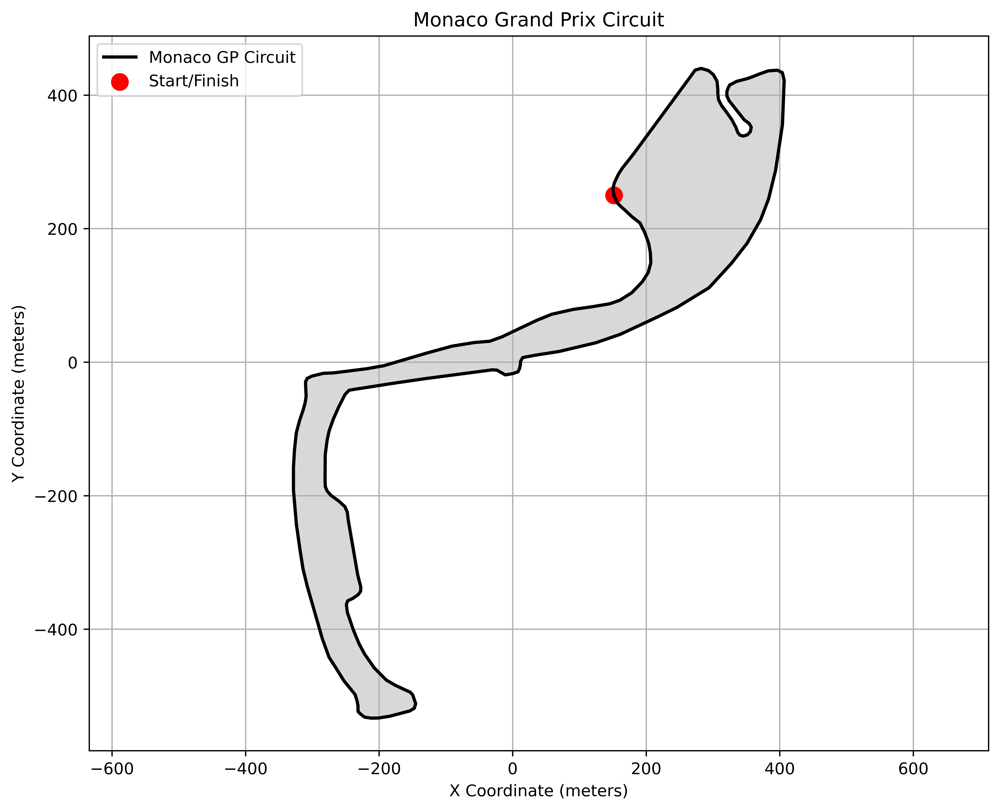

In [7]:
import json
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp


# Function to convert latitude and longitude to Cartesian coordinates
def latlon_to_xy(lat, lon, lat0, lon0):
    R = 6371000  # Earth's radius in meters
    x = R * np.radians(lon - lon0) * np.cos(np.radians(lat0))
    y = R * np.radians(lat - lat0)
    return x, y

# Load the GeoJSON data for the Monaco circuit
with open('mc-1929.geojson', 'r') as f:
    geojson_data = json.load(f)

# Extract coordinates from the GeoJSON data
coordinates = geojson_data['features'][0]['geometry']['coordinates']
lons, lats = zip(*coordinates)

# Reference point for coordinate conversion (mean latitude and longitude)
lat0, lon0 = np.mean(lats), np.mean(lons)

# Convert GPS coordinates to Cartesian coordinates
x, y = latlon_to_xy(np.array(lats), np.array(lons), lat0, lon0)

# Plot the Monaco Grand Prix Circuit
plt.figure(figsize=(10, 8))
plt.plot(x, y, 'k-', linewidth=2, label='Monaco GP Circuit')
plt.fill(x, y, 'gray', alpha=0.3)
plt.scatter(x[0], y[0], color='red', s=100, label='Start/Finish')
plt.title('Monaco Grand Prix Circuit')
plt.xlabel('X Coordinate (meters)')
plt.ylabel('Y Coordinate (meters)')
plt.legend()
plt.axis('equal')
plt.grid(True)
plt.show()

# Create a Smoothed Track

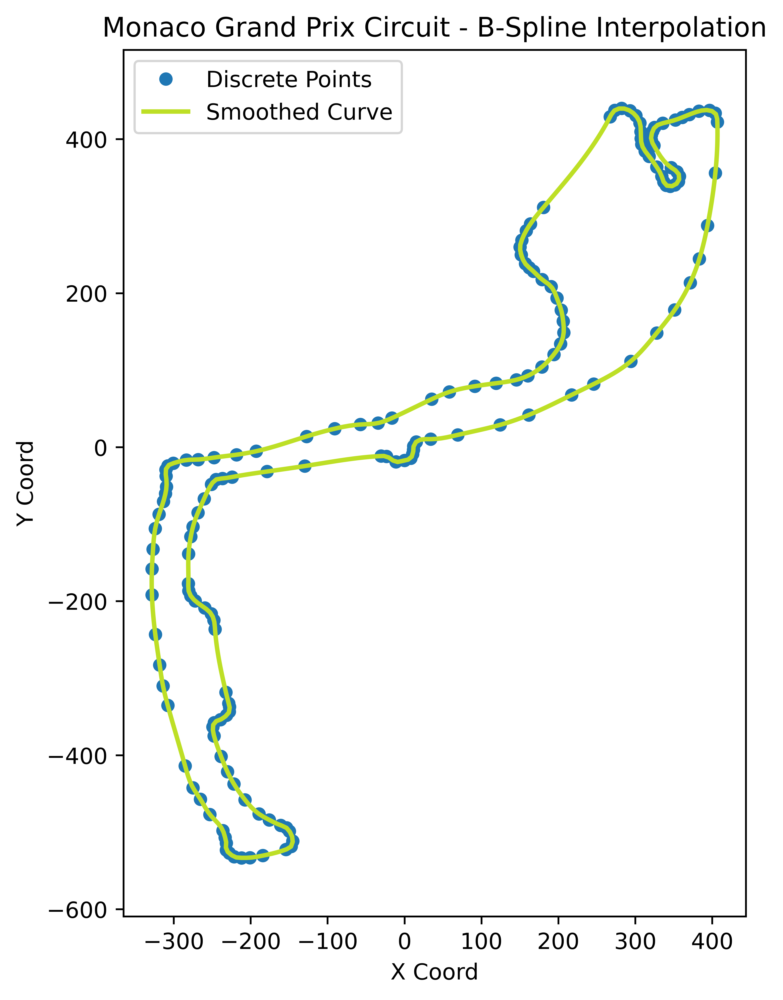

In [8]:
# Irregular loop of points
import json
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import splprep, splev
import matplotlib.colors as mcolors

def latlon_to_xy(lat, lon, lat0, lon0):
    R = 6371000  # Earth's radius in meters
    x = R * np.radians(lon - lon0) * np.cos(np.radians(lat0))
    y = R * np.radians(lat - lat0)
    return x, y

# Function to compute unit perpendicular vectors
def compute_perpendiculars(x, y):
    dx = np.gradient(x)
    dy = np.gradient(y)
    lengths = np.sqrt(dx**2 + dy**2)
    
    # Normalize to unit vectors
    dx /= lengths
    dy /= lengths
    
    # Perpendicular vectors (rotate 90 degrees)
    px = -dy
    py = dx
    
    return px, py

# Load the GeoJSON data for the Monaco circuit
with open('mc-1929.geojson', 'r') as f:
    geojson_data = json.load(f)

# Extract coordinates from the GeoJSON data
coordinates = geojson_data['features'][0]['geometry']['coordinates']
lons, lats = zip(*coordinates)

# Reference point for coordinate conversion (mean latitude and longitude)
lat0, lon0 = np.mean(lats), np.mean(lons)
x, y = latlon_to_xy(np.array(lats), np.array(lons), lat0, lon0)
tck, u = splprep([x, y], s=0, per=True)

# Generate smooth points
u_fine = np.linspace(0, 1, 500)
x_smooth, y_smooth = splev(u_fine, tck)

# Plot the smoothed track and the discrete points
plt.rcParams['figure.dpi'] = 800
plt.figure(figsize=(5, 7))

# Solve the boundary value problem
p0 = np.array([6])
viridis = cm.get_cmap('viridis')
green_rgb = viridis(0.9)  # RGBA tuple
green_hex = mcolors.to_hex(green_rgb)
plt.plot(x, y, 'o', label='Discrete Points', markersize=5)
plt.plot(x_smooth, y_smooth, '-', label='Smoothed Curve', linewidth=2, color=green_hex)
plt.title('Monaco Grand Prix Circuit - B-Spline Interpolation')
plt.xlabel('X Coord')
plt.ylabel('Y Coord')
plt.legend()
plt.axis('equal')
plt.show()

# Attempts at PMP

/var/folders/nm/jgfv46_n3kg1pc1ltp9d95vm0000gn/T/ipykernel_91361/603474084.py:15: RuntimeWarning: overflow encountered in square
  term1 = -8*x*(x**2/15 + y**2/10)**19/((x**2/15 + y**2/10)**20 + 1)**2
/var/folders/nm/jgfv46_n3kg1pc1ltp9d95vm0000gn/T/ipykernel_91361/603474084.py:16: RuntimeWarning: overflow encountered in power
  term2 = 42*x*(x**2/10 + y**2/5)**69/((x**2/10 + y**2/5)**70 + 1)**2
/var/folders/nm/jgfv46_n3kg1pc1ltp9d95vm0000gn/T/ipykernel_91361/603474084.py:16: RuntimeWarning: overflow encountered in square
  term2 = 42*x*(x**2/10 + y**2/5)**69/((x**2/10 + y**2/5)**70 + 1)**2
/var/folders/nm/jgfv46_n3kg1pc1ltp9d95vm0000gn/T/ipykernel_91361/603474084.py:16: RuntimeWarning: invalid value encountered in divide
  term2 = 42*x*(x**2/10 + y**2/5)**69/((x**2/10 + y**2/5)**70 + 1)**2
/var/folders/nm/jgfv46_n3kg1pc1ltp9d95vm0000gn/T/ipykernel_91361/603474084.py:17: RuntimeWarning: overflow encountered in square
  term3 = -120*x*(x**2 + y**2)**19/((x**2 + y**2)**20 + 1)**2
/var/fo

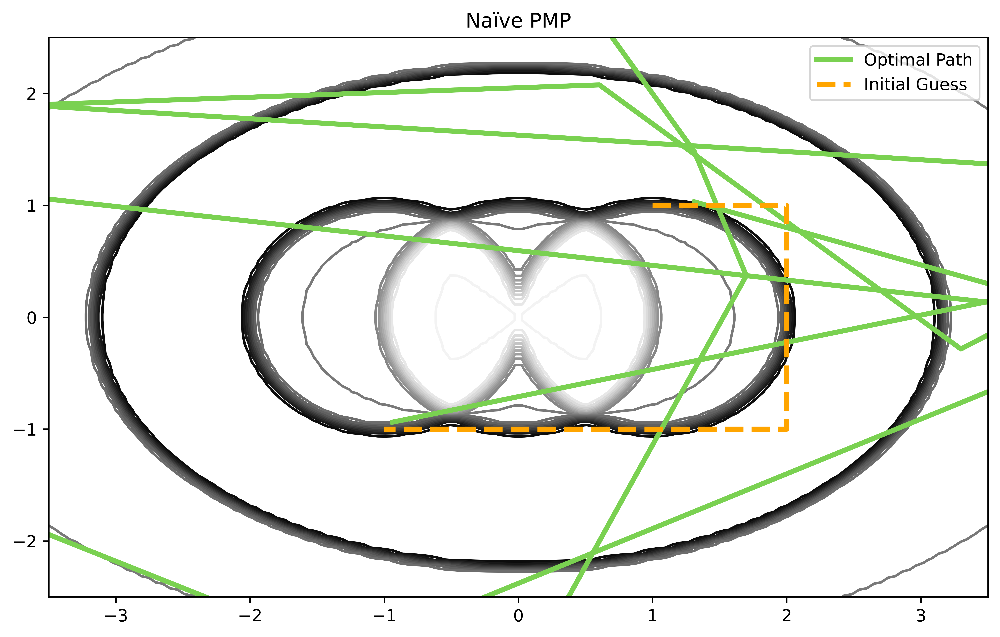

In [3]:
from scipy.integrate import solve_bvp   
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import cm

def C(x, y):
    term1 = 3 / ((x**2 / 15 + y**2 / 10)**20 + 1)
    term2 = -3 / ((x**2 / 10 + y**2 / 5)**70 + 1)
    term3 = 3 / (((x - 1)**2 + y**2)**20 + 1)
    term4 = 3 / (((x + 1)**2 + y**2)**20 + 1)
    term5 = 3 / ((x**2 + y**2)**20 + 1)
    return   term2 + term3 + term4 + term5

def dC_dx(x, y):
    term1 = -8*x*(x**2/15 + y**2/10)**19/((x**2/15 + y**2/10)**20 + 1)**2
    term2 = 42*x*(x**2/10 + y**2/5)**69/((x**2/10 + y**2/5)**70 + 1)**2
    term3 = -120*x*(x**2 + y**2)**19/((x**2 + y**2)**20 + 1)**2
    term4 = -3*(40*x - 40)*(y**2 + (x - 1)**2)**19/((y**2 + (x - 1)**2)**20 + 1)**2
    term5 = -3*(40*x + 40)*(y**2 + (x + 1)**2)**19/((y**2 + (x + 1)**2)**20 + 1)**2
    return term1 + term2 + term3 + term4 + term5

def dC_dy(x, y):
    term1 = -12*y*(x**2/15 + y**2/10)**19/((x**2/15 + y**2/10)**20 + 1)**2
    term2 = 84*y*(x**2/10 + y**2/5)**69/((x**2/10 + y**2/5)**70 + 1)**2
    term3 = -120*y*(x**2 + y**2)**19/((x**2 + y**2)**20 + 1)**2
    term4 = -120*y*(y**2 + (x - 1)**2)**19/((y**2 + (x - 1)**2)**20 + 1)**2
    term5 = -120*y*(y**2 + (x + 1)**2)**19/((y**2 + (x + 1)**2)**20 + 1)**2
    return term1 + term2 + term3 + term4 + term5

def prob4():
    #Define the parameters
    t_0 = 0
    t_f = 20
    cx, cy = 4, 1
    rx, ry = 5, .5
    lmbda = 20
    W1, W2 = 4, 0.1
    t_steps = 20
    
    #Define the ode and boundary conditions
    def ode_s(t, y, p):
        obdx = dC_dx(y[0], y[1])
        obdy = dC_dy(y[0], y[1])
        return p[0] * np.array([y[2], y[3], 1/(2*W2) * y[6], 1/(2*W2) * y[7], obdx, obdy, -y[4], -y[5]])
    
    def bc(ya, yb, p):
        H_tf = yb[4] * yb[2] + yb[5] * yb[3] + yb[6] * 1/(2*W2) * yb[6] + yb[7] * 1/(2*W2) * yb[7] - (1 + C(yb[0], yb[1]) + W2 * ((1/(2 * W2) * yb[6])**2 + (1/(2 * W2) * yb[7])**2))
        return np.array([ya[0] - 6, ya[1] - 1.5, ya[2], ya[3], yb[0], yb[1], yb[2], yb[3], H_tf])
    
    #Initial guess
    
    y0 = np.ones((8, t_steps))
    x1 = np.linspace(1, 2, int(0.2 * t_steps))
    y1 = np.linspace(1, 1, int(0.2 * t_steps))
    x2 = np.linspace(2, 2, int(0.3 * t_steps))
    y2 = np.linspace(1, -1, int(0.3 * t_steps))
    x3 = np.linspace(2, -1, int(0.5 * t_steps))
    y3 = np.linspace(-1, -1, int(0.5 * t_steps))
    
    y0[0,:] = np.concatenate((x1, x2, x3))
    y0[1,:] = np.concatenate((y1, y2, y3))
    y0[2,:] = 1*np.ones(t_steps)
    
    #Plot the contour
    x = np.linspace(-8, 8, 300)
    y = np.linspace(-8, 8, 300)
    X, Y = np.meshgrid(x, y)
    Z = C(X, Y)
    plt.rcParams['figure.dpi'] = 800
    plt.figure(figsize=(10, 6))
    plt.contour(X, Y, Z, levels=20, cmap="gist_gray")

    import matplotlib.colors as mcolors

    # Solve the boundary value problem
    p0 = np.array([6])
    viridis = cm.get_cmap('viridis')
    green_rgb = viridis(0.8)  # RGBA tuple
    green_hex = mcolors.to_hex(green_rgb)
    sol = solve_bvp(ode_s, bc, np.linspace(t_0, t_f, t_steps), y0, p0, max_nodes=60000)
    plt.plot(sol.y[0], sol.y[1], label='Optimal Path', color=green_hex, linewidth=3)
    plt.plot(y0[0], y0[1], label='Initial Guess', linestyle='--', color='orange', linewidth=3)
    plt.xlim(-3.5, 3.5)
    plt.ylim(-2.5, 2.5)
    plt.gca().set_title("Naïve PMP") 
    plt.legend()      
    plt.show()
    
prob4()
        

/var/folders/nm/jgfv46_n3kg1pc1ltp9d95vm0000gn/T/ipykernel_91361/4020206564.py:25: RuntimeWarning: overflow encountered in square
  denom_inner = r_inner[0] * (inner**20 + 1)**2
/var/folders/nm/jgfv46_n3kg1pc1ltp9d95vm0000gn/T/ipykernel_91361/4020206564.py:25: RuntimeWarning: overflow encountered in multiply
  denom_inner = r_inner[0] * (inner**20 + 1)**2
/var/folders/nm/jgfv46_n3kg1pc1ltp9d95vm0000gn/T/ipykernel_91361/4020206564.py:28: RuntimeWarning: overflow encountered in square
  denom_outer = r_outer[0] * (outer**20 + 1)**2
/var/folders/nm/jgfv46_n3kg1pc1ltp9d95vm0000gn/T/ipykernel_91361/4020206564.py:28: RuntimeWarning: overflow encountered in multiply
  denom_outer = r_outer[0] * (outer**20 + 1)**2
/var/folders/nm/jgfv46_n3kg1pc1ltp9d95vm0000gn/T/ipykernel_91361/4020206564.py:38: RuntimeWarning: overflow encountered in square
  denom_inner = r_inner[1] * (inner**20 + 1)**2
/var/folders/nm/jgfv46_n3kg1pc1ltp9d95vm0000gn/T/ipykernel_91361/4020206564.py:41: RuntimeWarning: overflo

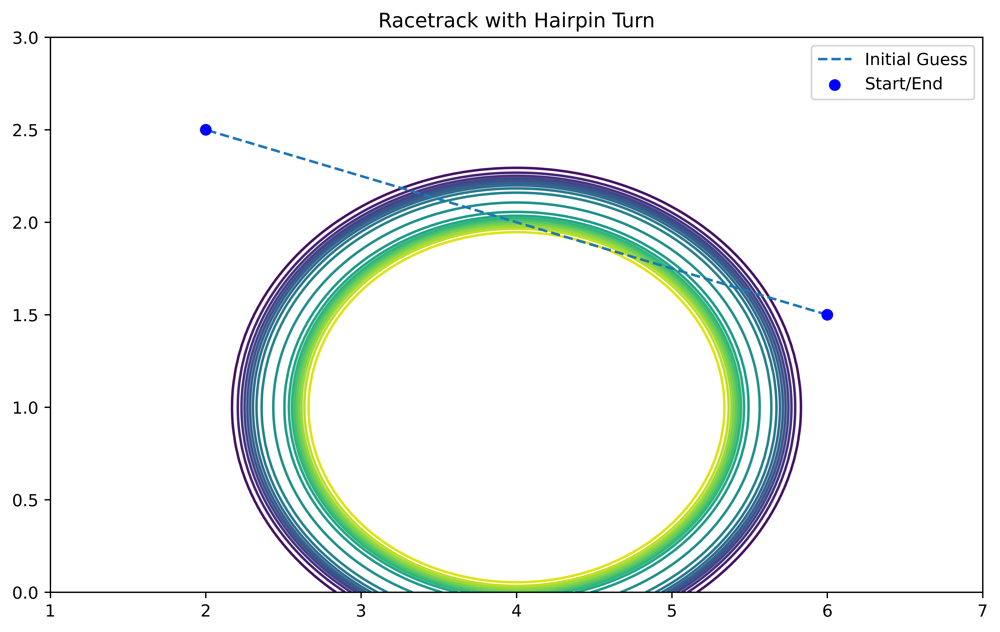

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_bvp

def track_boundaries(x, y, W1=1, r_inner=(2, 1), r_outer=(3, 1.5), c=(0, 0)):
    """
    Defines a racetrack using two elliptical barriers (inner and outer).
    
    Parameters:
        x, y: Position in space.
        W1: Weight for cost.
        r_inner, r_outer: Radii of inner and outer track limits.
        c: Center of the hairpin turn.
    """
    inner = ((x - c[0])**2 / r_inner[0] + (y - c[1])**2 / r_inner[1])**20 + 1
    outer = ((x - c[0])**2 / r_outer[0] + (y - c[1])**2 / r_outer[1])**20 + 1
    return W1 * (1 / inner + 1 / outer)

def track_boundaries_dx(x, y, W1=1, r_inner=(2, 1), r_outer=(3, 1.5), c=(0, 0)):
    """Derivative of the track boundaries with respect to x."""
    inner = (x - c[0])**2 / r_inner[0] + (y - c[1])**2 / r_inner[1]
    outer = (x - c[0])**2 / r_outer[0] + (y - c[1])**2 / r_outer[1]

    numer_inner = -40 * W1 * (x - c[0]) * inner**19
    denom_inner = r_inner[0] * (inner**20 + 1)**2

    numer_outer = -40 * W1 * (x - c[0]) * outer**19
    denom_outer = r_outer[0] * (outer**20 + 1)**2

    return numer_inner / denom_inner + numer_outer / denom_outer

def track_boundaries_dy(x, y, W1=1, r_inner=(2, 1), r_outer=(3, 1.5), c=(0, 0)):
    """Derivative of the track boundaries with respect to y."""
    inner = (x - c[0])**2 / r_inner[0] + (y - c[1])**2 / r_inner[1]
    outer = (x - c[0])**2 / r_outer[0] + (y - c[1])**2 / r_outer[1]

    numer_inner = -40 * W1 * (y - c[1]) * inner**19
    denom_inner = r_inner[1] * (inner**20 + 1)**2

    numer_outer = -40 * W1 * (y - c[1]) * outer**19
    denom_outer = r_outer[1] * (outer**20 + 1)**2

    return numer_inner / denom_inner + numer_outer / denom_outer

def prob4_racetrack():
    """Solves the optimal control problem for a racetrack with a hairpin turn."""
    # Parameters
    t_0, t_f = 0, 20
    cx, cy = 4, 1  # Center of the hairpin turn
    r_inner, r_outer = (2, 1), (3, 1.5)  # Inner and outer track radii
    W1, W2 = 4, 0.1  # Weights
    t_steps = 50  # More steps for better resolution

    # Define the ODE system
    def ode_s(t, y, p):
        obdx = track_boundaries_dx(y[0], y[1], W1, r_inner, r_outer, (cx, cy))
        obdy = track_boundaries_dy(y[0], y[1], W1, r_inner, r_outer, (cx, cy))
        return p[0] * np.array([
            y[2], 
            y[3], 
            1 / (2 * W2) * y[6], 
            1 / (2 * W2) * y[7], 
            obdx, 
            obdy, 
            -y[4], 
            -y[5]
        ])

    # Define boundary conditions
    def bc(ya, yb, p):
        H_tf = (yb[4] * yb[2] + yb[5] * yb[3] + yb[6] * 1 / (2 * W2) * yb[6] + 
                yb[7] * 1 / (2 * W2) * yb[7] - (1 + track_boundaries(yb[0], yb[1], W1, r_inner, r_outer, (cx, cy)) + 
                W2 * ((1 / (2 * W2) * yb[6])**2 + (1 / (2 * W2) * yb[7])**2)))
        return np.array([
            ya[0] - 6,  # Start X
            ya[1] - 1.5,  # Start Y
            ya[2],  # Start velocity X
            ya[3],  # Start velocity Y
            yb[0] - 2,  # End X after hairpin
            yb[1] - 2.5,  # End Y after hairpin
            yb[2],  # End velocity X
            yb[3],  # End velocity Y
            H_tf  # Hamiltonian condition
        ])

    # Initial guess
    y0 = np.ones((8, t_steps))
    x = np.linspace(6, 2, t_steps)  # Move from right to left
    y1 = np.linspace(1.5, 2.5, t_steps)  # Simulate curving upwards
    y0[0, :] = x
    y0[1, :] = y1
    y0[2, :] = -1 * np.ones(t_steps)  # Negative X velocity
    y0[3, :] = np.zeros(t_steps)  # Y velocity zero initially

    # Plot the track
    x_vals = np.linspace(1, 7, 300)
    y_vals = np.linspace(0, 3, 300)
    X, Y = np.meshgrid(x_vals, y_vals)
    Z = track_boundaries(X, Y, W1, r_inner, r_outer, (cx, cy))

    plt.figure(figsize=(10, 6))
    plt.contour(X, Y, Z, levels=25, cmap="viridis")
    plt.title("Racetrack with Hairpin Turn")

    # Solve the BVP
    p0 = np.array([6])  # Initial estimate for the time multiplier
    sol = solve_bvp(ode_s, bc, np.linspace(t_0, t_f, t_steps), y0, p0, max_nodes=60000)

    # Plot optimal path
    # plt.plot(sol.y[0], sol.y[1], label="Optimal Path", color="red")
    plt.plot(y0[0], y0[1], label="Initial Guess", linestyle="dashed")
    plt.scatter([6, 2], [1.5, 2.5], color="blue", label="Start/End", zorder=3)
    plt.legend()
    plt.show()

prob4_racetrack()

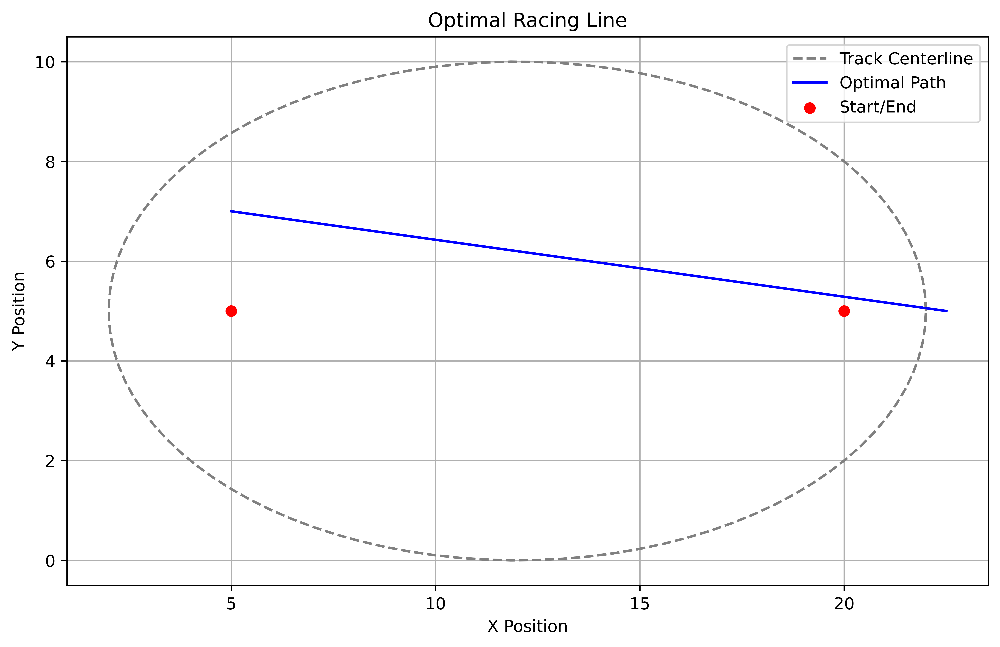

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_bvp

# Define racetrack shape (simple oval)
def racetrack(theta, a=10, b=5, shift_x=12, shift_y=5):
    """Parametric equation for an oval track."""
    x = shift_x + a * np.cos(theta)
    y = shift_y + b * np.sin(theta)
    return x, y

# Define an "obstacle-like" cost function to keep the car near the centerline
def track_cost(x, y, center_x, center_y, W1=5):
    """Penalty function for deviation from track centerline."""
    deviation = (x - center_x) ** 2 + (y - center_y) ** 2
    return W1 / (deviation + 1)  # Higher penalty for deviation

# Define derivatives of the track cost function
def track_cost_dx(x, y, center_x, center_y, W1=5):
    deviation = (x - center_x) ** 2 + (y - center_y) ** 2
    return -2 * W1 * (x - center_x) / (deviation + 1) ** 2

def track_cost_dy(x, y, center_x, center_y, W1=5):
    deviation = (x - center_x) ** 2 + (y - center_y) ** 2
    return -2 * W1 * (y - center_y) / (deviation + 1) ** 2

# Define the racecar dynamics and Hamiltonian system
def racecar_ode(t, y, p):
    """
    Defines the system of equations for the optimal control problem.
    """
    x, y_pos, vx, vy, λ_x, λ_y, λ_vx, λ_vy = y

    # Get track centerline for this position
    theta_nearest = np.arctan2(y_pos - 5, x - 12)  # Approximate nearest theta
    center_x, center_y = racetrack(theta_nearest)

    # Compute cost function derivatives
    cost_dx = track_cost_dx(x, y_pos, center_x, center_y)
    cost_dy = track_cost_dy(x, y_pos, center_x, center_y)

    # Control variables (acceleration)
    ax = -λ_vx / (2 * 0.1)  # W2 = 0.1
    ay = -λ_vy / (2 * 0.1)

    return np.array([
        vx, vy,  # dx/dt, dy/dt
        ax, ay,  # dvx/dt, dvy/dt
        cost_dx, cost_dy,  # dλ_x/dt, dλ_y/dt
        -λ_x, -λ_y  # dλ_vx/dt, dλ_vy/dt
    ])

# Define boundary conditions
def racecar_bc(ya, yb, p):
    """
    Boundary conditions for start and end points on the racetrack.
    """
    H_tf = (yb[4] * yb[2] + yb[5] * yb[3] + 
            yb[6]**2 / (2 * 0.1) + yb[7]**2 / (2 * 0.1) - 
            (1 + track_cost(yb[0], yb[1], *racetrack(np.arctan2(yb[1] - 5, yb[0] - 12)))))

    return np.array([
        ya[0] - 22.5,  # Start x
        ya[1] - 5,   # Start y
        ya[2] - 2,   # Start vx
        ya[3],       # Start vy

        yb[0] - 5,   # End x
        yb[1] - 5,   # End y
        yb[2] - 2,   # End vx
        yb[3],       # End vy

        H_tf  # Hamiltonian boundary condition
    ])

# Initial guess
t_vals = np.linspace(0, 10, 50)  # Time grid
y_guess = np.zeros((8, len(t_vals)))

# Approximate start-to-end straight-line guess
y_guess[0, :] = np.linspace(22.5, 5, len(t_vals))  # x position
y_guess[1, :] = np.linspace(5, 7, len(t_vals))   # y position
y_guess[2, :] = 2  # Initial x velocity
y_guess[3, :] = 0  # Initial y velocity

# Solve the BVP
sol = solve_bvp(racecar_ode, racecar_bc, t_vals, y_guess, p=np.array([0]))

# Extract optimal trajectory
x_opt, y_opt = sol.y[0], sol.y[1]

# Plot the racetrack and optimal trajectory
theta_vals = np.linspace(0, 2 * np.pi, 100)
track_x, track_y = racetrack(theta_vals)

plt.figure(figsize=(10, 6))
plt.plot(track_x, track_y, '--', color='gray', label="Track Centerline")
plt.plot(x_opt, y_opt, label="Optimal Path", color="blue")
plt.scatter([20, 5], [5, 5], color="red", label="Start/End", zorder=3)
plt.xlabel("X Position")
plt.ylabel("Y Position")
plt.legend()
plt.grid()
plt.title("Optimal Racing Line")
plt.show()

# First Pass through Data Assimilation

/var/folders/nm/jgfv46_n3kg1pc1ltp9d95vm0000gn/T/ipykernel_34284/619161531.py:144: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "-" (-> linestyle='-'). The keyword argument will take precedence.
  plt.plot(x_smooth[start_x:end_x], y_smooth[start_x:end_x], '-', label='Track', linewidth=2, color='k', linestyle='--')


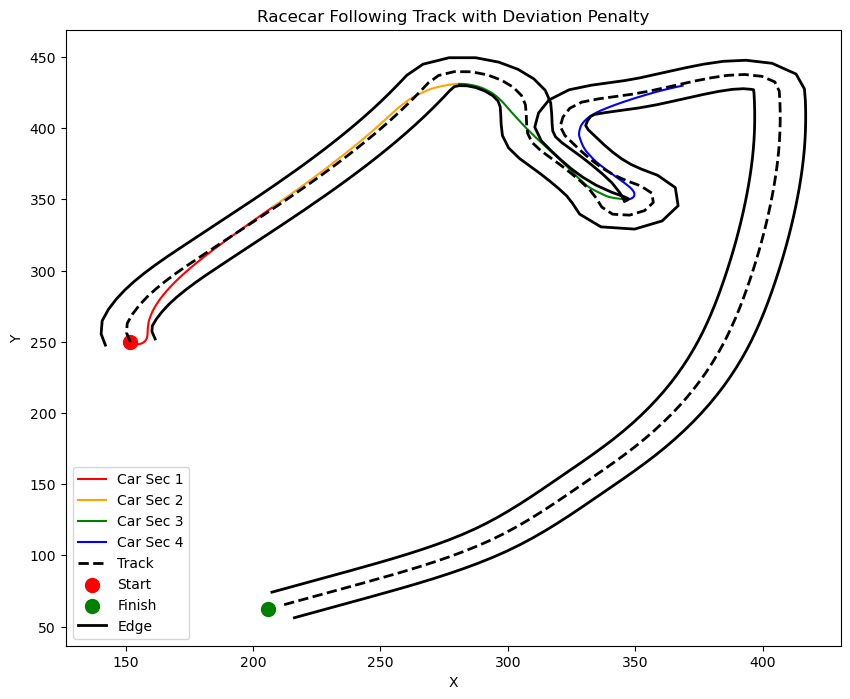

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from scipy.integrate import solve_ivp

# Define track (x_smooth, y_smooth)
start_x, end_x = 0, 150
t = np.linspace(0, 1, len(x_smooth[start_x:end_x]))
x_interp = interp1d(t, x_smooth[start_x:end_x], kind='cubic')
y_interp = interp1d(t, y_smooth[start_x:end_x], kind='cubic')


# Car parameters
L = 3  # Wheelbase
max_accel = 8  # Max acceleration
max_steer = np.radians(50)  # Max steering angle

def speed_control(x, y, v, base_accel=3.0):
    """
    Adjusts acceleration based on track curvature.

    Parameters:
        x, y: Current vehicle position.
        v: Current velocity.
        base_accel: Desired acceleration level.

    Returns:
        Adjusted acceleration.
    """
    t_vals = np.linspace(0, 1, 100)
    track_points = np.array([x_interp(t_vals), y_interp(t_vals)]).T
    distances = np.linalg.norm(track_points - np.array([x, y]), axis=1)
    closest_idx = np.argmin(distances)

    # Compute curvature (approximate)
    if closest_idx < len(t_vals) - 2:
        p1 = track_points[closest_idx]
        p2 = track_points[closest_idx + 1]
        p3 = track_points[closest_idx + 2]

        # Curvature formula: k = (dx * ddy - dy * ddx) / ((dx^2 + dy^2)^(3/2))
        dx = p2[0] - p1[0]
        dy = p2[1] - p1[1]
        ddx = p3[0] - 2 * p2[0] + p1[0]
        ddy = p3[1] - 2 * p2[1] + p1[1]

        curvature = abs(dx * ddy - dy * ddx) / (dx**2 + dy**2 + 1e-3)**(1.5)
    else:
        curvature = 0.0  # Straight line

    # Reduce acceleration when approaching high curvature
    max_speed = max(5.0, 12.0 - 50 * curvature)  # Slower in sharp turns

    if v > max_speed:
        return -2.0  # Brake if too fast
    else:
        return base_accel  # Accelerate normally

def stanley_controller(x, y, theta, v, lookahead=0.03, k=1.5, damping=0.1):
    """
    Stanley Controller for steering correction.
    
    Parameters:
        x, y: Current vehicle position.
        theta: Current vehicle heading angle.
        v: Current velocity.
        lookahead: Look-ahead distance for reference point.
        k: Gain factor for cross-track error correction.
    
    Returns:
        Steering angle delta
    """
    # Find the closest point on the track
    t_vals = np.linspace(0, 1, 100)
    track_points = np.array([x_interp(t_vals), y_interp(t_vals)]).T
    distances = np.linalg.norm(track_points - np.array([x, y]), axis=1, ord=2)
    closest_idx = np.argmin(distances)

    # Lookahead point
    lookahead_idx = min(closest_idx + int(lookahead * len(t_vals)), len(t_vals) - 1)
    target_x, target_y = track_points[lookahead_idx]

    # Compute cross-track error
    cross_track_error = (np.linalg.norm([target_x - x, target_y - y]) / 50) ** 2
    track_heading = np.arctan2(target_y - y, target_x - x)
    heading_error = track_heading - theta

    # Stanley steering law
    delta = heading_error + np.arctan(k * cross_track_error / (v + 1e-3))
    delta = delta * (1 - damping * abs(delta))

    return np.clip(delta, -max_steer, max_steer)

# Define racecar dynamics
def racecar_dynamics(t, state, control_func):
    x, y, v, theta = state
    a, delta = control_func(t, state)  # Get control inputs

    # Update state using simple kinematic model
    dxdt = v * np.cos(theta)
    dydt = v * np.sin(theta)
    dvdt = np.clip(a, -max_accel, max_accel)  # Limit acceleration
    dthetadt = (v / L) * np.tan(np.clip(delta, -max_steer, max_steer))  # Steering dynamics
    
    return [dxdt, dydt, dvdt, dthetadt]

# Control strategy with penalty for deviation
def control_func(t, state):
    x, y, v, theta = state

    # Get smooth steering using damped Stanley Controller
    delta = stanley_controller(x, y, theta, v, k=1.2, damping=0.3)
    a = speed_control(x, y, v)

    return a, delta



# Solve the system
plt.figure(figsize=(10, 8))
t_span = [0, 10]
y0 = [x_smooth[start_x], y_smooth[start_x], 10.0, -np.pi/3]  # Initial state (start at first track point)
sol = solve_ivp(racecar_dynamics, t_span, y0, args=(control_func,), t_eval=np.linspace(0, t_span[1], 500), method="RK45")
plt.plot(sol.y[0], sol.y[1], 'r', label="Car Sec 1")
t_span = [0,10]
y0 = [sol.y[0][-1], sol.y[1][-1], sol.y[2][-1], sol.y[3][-1]]  # Initial state (start at first track point)
sol2 = solve_ivp(racecar_dynamics, t_span, y0, args=(control_func,), t_eval=np.linspace(0, t_span[1], 500), method="RK45")
plt.plot(sol2.y[0], sol2.y[1], 'orange', label="Car Sec 2")
t_span = [0,10]
y0 = [sol2.y[0][-1], sol2.y[1][-1], sol2.y[2][-1], sol2.y[3][-1]]  # Initial state (start at first track point)
sol3 = solve_ivp(racecar_dynamics, t_span, y0, args=(control_func,), t_eval=np.linspace(0, t_span[1], 500), method="RK45")
plt.plot(sol3.y[0], sol3.y[1], 'green', label="Car Sec 3")
t_span = [0,10]
y0 = [sol3.y[0][-1], sol3.y[1][-1], sol3.y[2][-1], sol3.y[3][-1]]  # Initial state (start at first track point)
sol4 = solve_ivp(racecar_dynamics, t_span, y0, args=(control_func,), t_eval=np.linspace(0, t_span[1], 500), method="RK45")
plt.plot(sol4.y[0], sol4.y[1], 'blue', label="Car Sec 4")

# Plot the track and trajectory
plt.plot(x_smooth[start_x:end_x], y_smooth[start_x:end_x], '-', label='Track', linewidth=2, color='k', linestyle='--')
plt.scatter(x_smooth[start_x], y_smooth[start_x], color='red', s=100, label='Start')
plt.scatter(x_smooth[end_x], y_smooth[end_x], color='green', s=100, label='Finish')

def compute_perpendiculars(x, y):
    dx = np.gradient(x)
    dy = np.gradient(y)
    lengths = np.sqrt(dx**2 + dy**2)
    dx /= lengths
    dy /= lengths
    px = -dy
    py = dx
    return px, py

px, py = compute_perpendiculars(x_smooth[start_x:end_x], y_smooth[start_x:end_x])
track_width = 20  # Adjust as needed
x_outer = x_smooth[start_x:end_x] + (track_width / 2) * px
y_outer =  y_smooth[start_x:end_x] + (track_width / 2) * py
x_inner = x_smooth[start_x:end_x] - (track_width / 2) * px
y_inner =  y_smooth[start_x:end_x] - (track_width / 2) * py
plt.plot(x_outer, y_outer, color='black', linewidth=2, label='Edge')
plt.plot(x_inner, y_inner, color='black', linewidth=2)
plt.xlabel("X")
plt.ylabel("Y")
plt.title("Racecar Following Track with Deviation Penalty")
plt.legend(loc='lower left')

plt.show()

# Second Attempt at Data Assimilation

/var/folders/nm/jgfv46_n3kg1pc1ltp9d95vm0000gn/T/ipykernel_81392/3315260524.py:212: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "-" (-> linestyle='-'). The keyword argument will take precedence.
  plt.plot(x_smooth[start_x:end_x], y_smooth[start_x:end_x], '-', label='Track', linewidth=2, color='k', linestyle='--')


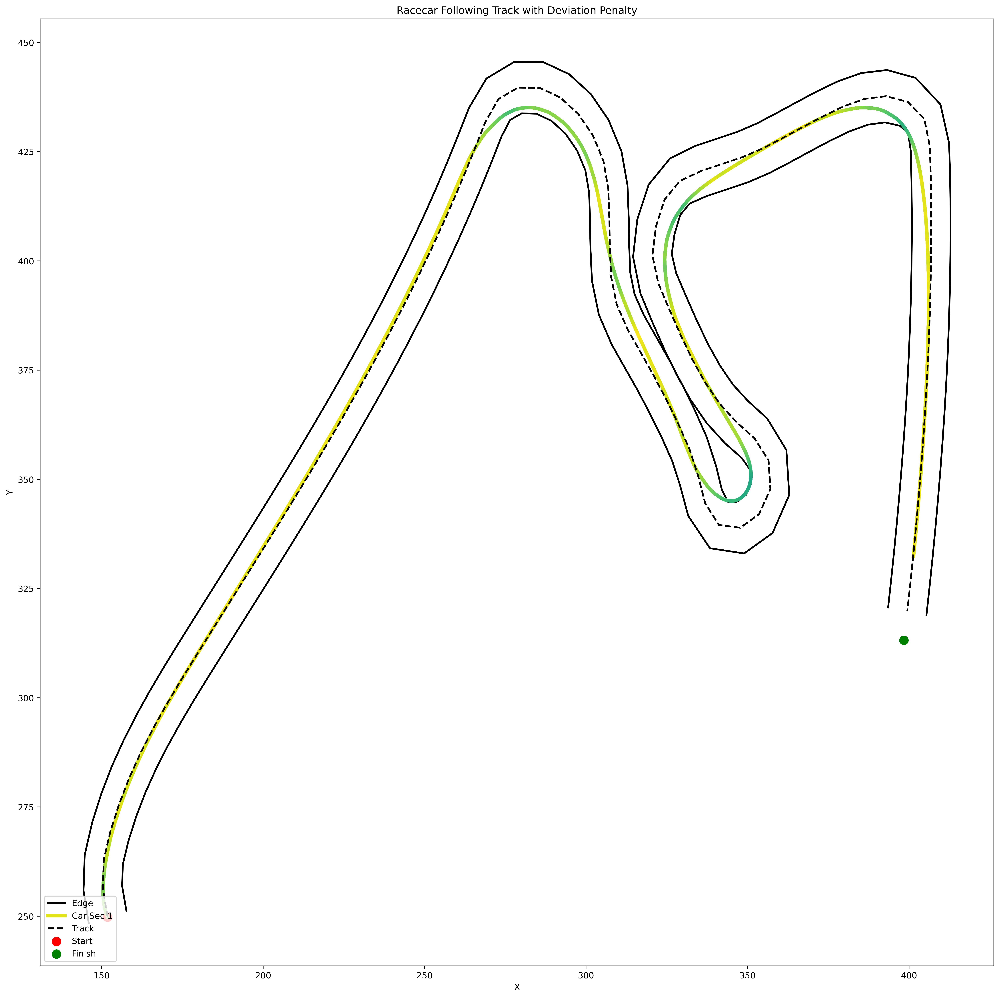

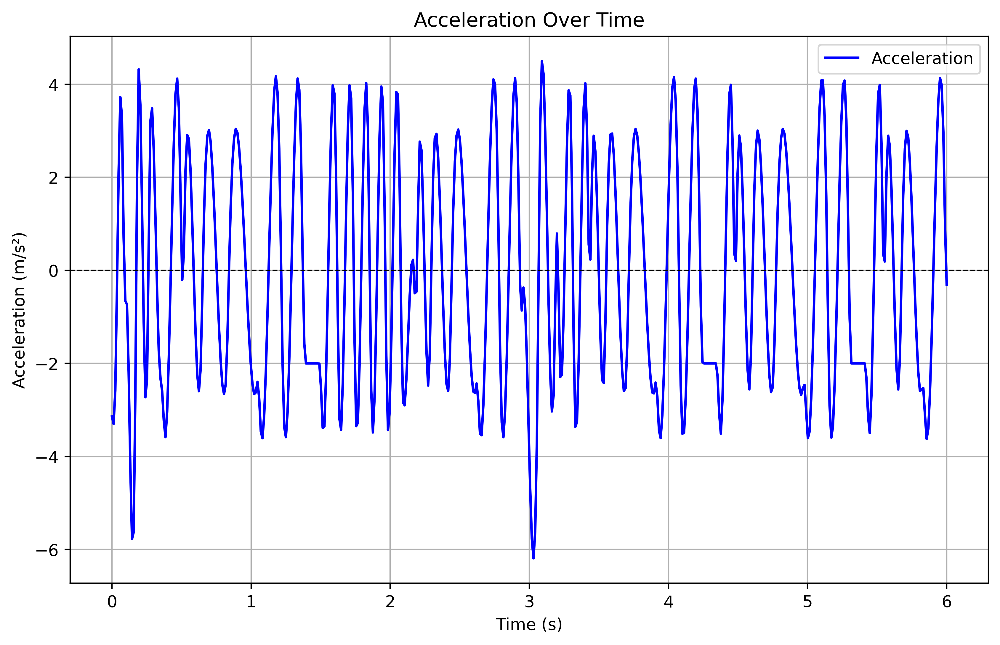

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from scipy.integrate import solve_ivp

# Define track (x_smooth, y_smooth)
start_x, end_x = 0, 100
t = np.linspace(0, 1, len(x_smooth[start_x:end_x]))
x_interp = interp1d(t, x_smooth[start_x:end_x], kind='cubic')
y_interp = interp1d(t, y_smooth[start_x:end_x], kind='cubic')


# Car parameters
L = 3  # Wheelbase
max_accel = 50 # Max acceleration
max_steer = np.radians(30)  # Max steering angle

def speed_control(x, y, v, base_accel=3.0):
    """
    Adjusts acceleration based on track curvature.

    Parameters:
        x, y: Current vehicle position.
        v: Current velocity.
        base_accel: Desired acceleration level.

    Returns:
        Adjusted acceleration.
    """
    t_vals = np.linspace(0, 1, 100)
    track_points = np.array([x_interp(t_vals), y_interp(t_vals)]).T
    distances = np.linalg.norm(track_points - np.array([x, y]), axis=1)
    closest_idx = np.argmin(distances)

    # Compute curvature (approximate)
    if closest_idx < len(t_vals) - 2:
        p1 = track_points[closest_idx]
        p2 = track_points[closest_idx + 1]
        p3 = track_points[closest_idx + 2]

        # Curvature formula: k = (dx * ddy - dy * ddx) / ((dx^2 + dy^2)^(3/2))
        dx = p2[0] - p1[0]
        dy = p2[1] - p1[1]
        ddx = p3[0] - 2 * p2[0] + p1[0]
        ddy = p3[1] - 2 * p2[1] + p1[1]

        curvature = abs(dx * ddy - dy * ddx) / (dx**2 + dy**2 + 1e-3)**(1.5)
    else:
        curvature = 0.0  # Straight line

    # Reduce acceleration when approaching high curvature
    max_speed = max(5.0, 12.0 - 50 * curvature)  # Slower in sharp turns

    if v > max_speed:
        return -2.0  # Brake if too fast
    else:
        return base_accel  # Accelerate normally

def stanley_controller(x, y, theta, v, lookahead=2, k=1.5, damping=0.1):
    """
    Stanley Controller for steering correction.
    
    Parameters:
        x, y: Current vehicle position.
        theta: Current vehicle heading angle.
        v: Current velocity.
        lookahead: Look-ahead distance for reference point.
        k: Gain factor for cross-track error correction.
    
    Returns:
        Steering angle delta
    """
    # Find the closest point on the track
    t_vals = np.linspace(0, 1, 100)
    track_points = np.array([x_interp(t_vals), y_interp(t_vals)]).T
    distances = np.linalg.norm(track_points - np.array([x, y]), axis=1, ord=2)
    closest_idx = np.argmin(distances)

    # Lookahead point
    lookahead_idx = min(closest_idx + lookahead, len(t_vals) - 1)
    target_x, target_y = track_points[lookahead_idx]

    # Compute cross-track error
    cross_track_error = (np.linalg.norm([target_x - x, target_y - y]) / 50) ** 2

    # Compute heading error
    track_heading = np.arctan2(target_y - y, target_x - x)
    heading_error = track_heading - theta

    # Stanley steering law
    delta = heading_error + np.arctan(k * cross_track_error / (v + 1e-3))
    delta = delta * (1 - damping * abs(delta))

    return np.clip(delta, -max_steer, max_steer)

# Define racecar dynamics
def racecar_dynamics(t, state, control_func, lookahead=2):
    x, y, v, theta = state
    a, delta = control_func(t, state, lookahead)  # Get control inputs

    dxdt = v * np.cos(theta)
    dydt = v * np.sin(theta)
    dvdt = np.clip(a, -max_accel, max_accel)  # Limit acceleration
    dthetadt = (v / L) * np.tan(np.clip(delta, -max_steer, max_steer))  # Steering dynamics
    
    return [dxdt, dydt, dvdt, dthetadt]


def hamiltonian(state, costate, control):
    """
    Compute the Hamiltonian for the system.

    Parameters:
        state: [x, y, v, theta]
        costate: [λ_x, λ_y, λ_v, λ_theta]
        control: [a, delta] (acceleration, steering angle)

    Returns:
        Hamiltonian value
    """
    x, y, v, theta = state
    λ_x, λ_y, λ_v, λ_theta = costate
    a, delta = control

    # Compute derivatives
    dxdt = v * np.cos(theta)
    dydt = v * np.sin(theta)
    dvdt = np.clip(a, -max_accel, max_accel)
    dthetadt = (v / L) * np.tan(np.clip(delta, -max_steer, max_steer))

    # Define Hamiltonian
    H = λ_x * dxdt + λ_y * dydt + λ_v * dvdt + λ_theta * dthetadt + 1  # "+1" to minimize time

    return H

# Control strategy with penalty for deviation
def control_func(t, state, lookahead=2):
    x, y, v, theta = state

    # Get smooth steering using damped Stanley Controller
    delta = stanley_controller(x, y, theta, v, lookahead=lookahead, k=1.2, damping=0.3)

    # Get acceleration based on curvature-aware speed control
    a = speed_control(x, y, v)
    # Compute costate variables (λ_x, λ_y, λ_v, λ_theta)
    λ_x = -2 * (x - x_interp(0.5))  # Example penalty for deviation from center
    λ_y = -2 * (y - y_interp(0.5))  # Example penalty for deviation from center
    λ_v = 0  # No penalty for velocity in this example
    λ_theta = 0  # No penalty for heading angle in this example

    # Compute Hamiltonian
    H = hamiltonian(state, [λ_x, λ_y, λ_v, λ_theta], [a, delta])
    # Penalize acceleration and steering angle in the Hamiltonian
    penalty_a = 0.1 * a**2  # Quadratic penalty for acceleration
    penalty_delta = 0.1 * delta**2  # Quadratic penalty for steering angle
    H += penalty_a + penalty_delta

    return a, delta


plt.figure(figsize=(20, 20))
#Plot the track
def compute_perpendiculars(x, y):
    dx = np.gradient(x)
    dy = np.gradient(y)
    lengths = np.sqrt(dx**2 + dy**2)
    dx /= lengths
    dy /= lengths
    px = -dy
    py = dx
    return px, py

px, py = compute_perpendiculars(x_smooth[start_x:end_x], y_smooth[start_x:end_x])
track_width = 12  # Adjust as needed
linewidth = 4
x_outer = x_smooth[start_x:end_x] + (track_width / 2) * px
y_outer =  y_smooth[start_x:end_x] + (track_width / 2) * py
x_inner = x_smooth[start_x:end_x] - (track_width / 2) * px
y_inner =  y_smooth[start_x:end_x] - (track_width / 2) * py
plt.plot(x_outer, y_outer, color='black', linewidth=2, label='Edge')
plt.plot(x_inner, y_inner, color='black', linewidth=2)

# Solve the system
len_of_systems = 6
t_span = [0, len_of_systems]
y0 = [x_smooth[start_x], y_smooth[start_x], 10.0, np.pi/1.5]  # Initial state (start at first track point)
sol = solve_ivp(racecar_dynamics, t_span, y0, args=(control_func, 2), t_eval=np.linspace(0, t_span[1], 500), method="RK45")
total_x = sol.y[0]
total_y = sol.y[1]
for j in range(len(sol.t) - 1):
        plt.plot(
            sol.y[0][j:j+2], sol.y[1][j:j+2],
            color=plt.cm.viridis(sol.y[2][j] / 12.5),  # Normalize velocity for color mapping
            linewidth=linewidth)

for i in range(8):
    t_span = [0, len_of_systems]
    y0 = [sol.y[0][-1], sol.y[1][-1], sol.y[2][-1], sol.y[3][-1]]  # Initial state (start at last point of previous segment)
    sol = solve_ivp(racecar_dynamics, t_span, y0, args=(control_func, 3), t_eval=np.linspace(0, t_span[1], 500), method="RK45")
    total_x = np.concatenate((total_x, sol.y[0]))
    total_y = np.concatenate((total_y, sol.y[1]))
    # Plot each segment with color based on velocity
    for j in range(len(sol.t) - 1):
        plt.plot(
            sol.y[0][j:j+2], sol.y[1][j:j+2],
            color=plt.cm.viridis(sol.y[2][j] / 12.5),  # Normalize velocity for color mapping
            linewidth=linewidth, label="Car Sec 1" if i == 0 and j == 0 else None
        )


# Plot the track and trajectory
plt.plot(x_smooth[start_x:end_x], y_smooth[start_x:end_x], '-', label='Track', linewidth=2, color='k', linestyle='--')
plt.scatter(x_smooth[start_x], y_smooth[start_x], color='red', s=100, label='Start')
plt.scatter(x_smooth[end_x], y_smooth[end_x], color='green', s=100, label='Finish')

plt.xlabel("X")
plt.ylabel("Y")
plt.title("Racecar Following Track with Deviation Penalty")
plt.legend(loc='lower left')

plt.show()

# Extract acceleration (dv/dt) from the solution
time = sol.t
velocity = sol.y[2]
acceleration = np.gradient(velocity, time)

# Plot acceleration over time
plt.figure(figsize=(10, 6))
plt.plot(time, acceleration, label="Acceleration", color="blue")
plt.axhline(0, color="black", linestyle="--", linewidth=0.8)
plt.xlabel("Time (s)")
plt.ylabel("Acceleration (m/s²)")
plt.title("Acceleration Over Time")
plt.legend()
plt.grid()
plt.show()

225 225
151.81682032988758 249.79940270680814


/var/folders/nm/jgfv46_n3kg1pc1ltp9d95vm0000gn/T/ipykernel_81392/2133001248.py:49: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "-" (-> linestyle='-'). The keyword argument will take precedence.
  ax.plot(x_smooth[start_x:end_x], y_smooth[start_x:end_x], '-', label='Track', linewidth=2, color='k', linestyle='--')


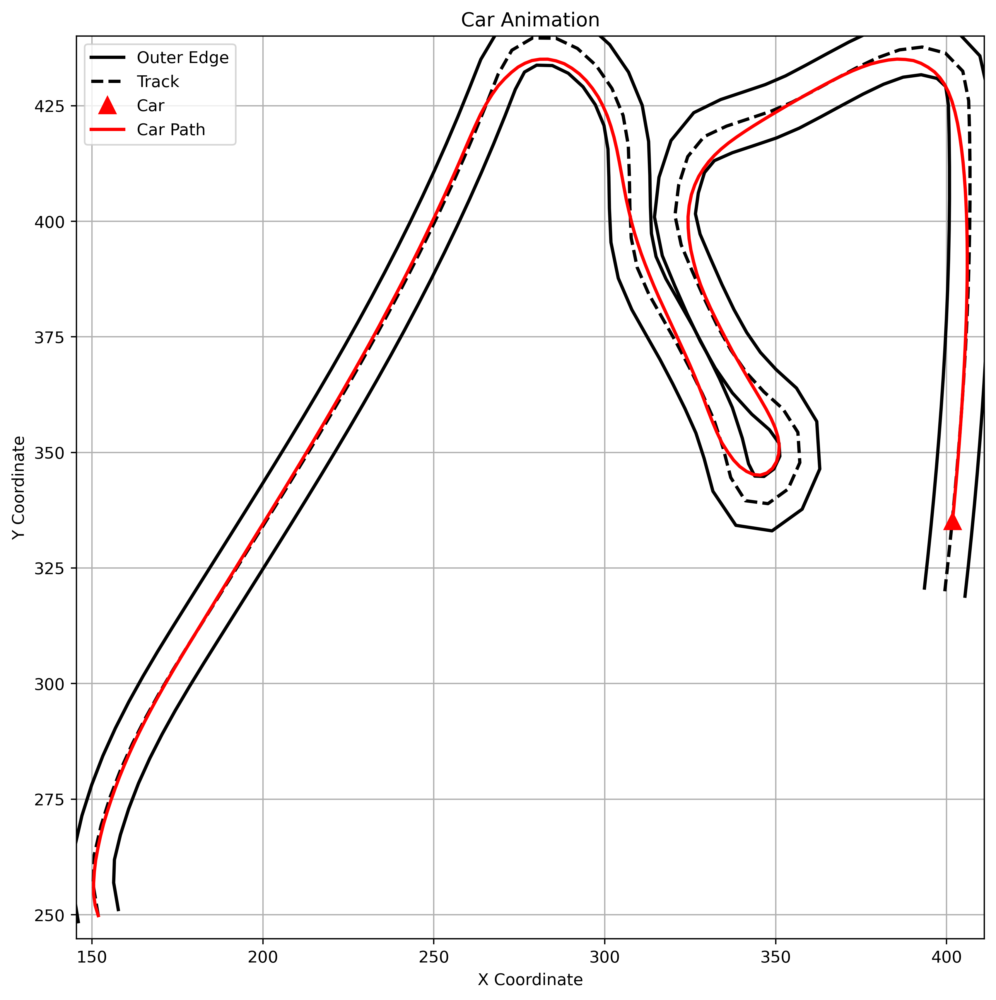

In [50]:
from matplotlib.animation import FuncAnimation, PillowWriter
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation

# Ensure total_x, total_y exist
print(len(total_x), len(total_y))
print(total_x[0], total_y[0])
total_x = new_x
total_y = new_y
new_x = np.array(total_x)
new_y = np.array(total_y)
# Shorten total_x to just 400 points throughout
total_x = total_x[::20]
total_y = total_y[::20]

fig, ax = plt.subplots(figsize=(10, 10))
ax.set_xlim(np.min(total_x) - 5, np.max(total_x) + 5)
ax.set_ylim(np.min(total_y) - 5, np.max(total_y) + 5)
ax.set_title("Car Animation")
ax.set_xlabel("X Coordinate")
ax.set_ylabel("Y Coordinate")

# Track and car parameters (make sure the following variables are defined)
def compute_perpendiculars(x, y):
    dx = np.gradient(x)
    dy = np.gradient(y)
    lengths = np.sqrt(dx**2 + dy**2)
    dx /= lengths
    dy /= lengths
    px = -dy
    py = dx
    return px, py

px, py = compute_perpendiculars(x_smooth[start_x:end_x], y_smooth[start_x:end_x])
track_width = 12  # Adjust as needed
linewidth = 4
x_outer = x_smooth[start_x:end_x] + (track_width / 2) * px
y_outer = y_smooth[start_x:end_x] + (track_width / 2) * py
x_inner = x_smooth[start_x:end_x] - (track_width / 2) * px
y_inner = y_smooth[start_x:end_x] - (track_width / 2) * py

# Plot the track and edges
ax.plot(x_outer, y_outer, color='black', linewidth=2, label='Outer Edge')
ax.plot(x_inner, y_inner, color='black', linewidth=2)
ax.plot(x_smooth[start_x:end_x], y_smooth[start_x:end_x], '-', label='Track', linewidth=2, color='k', linestyle='--')

# Initialize the car marker as a triangle and car path line
car_marker, = ax.plot([], [], '^', markersize=10, color='red', label='Car')
car_line, = ax.plot([], [], 'r-', linewidth=2, label='Car Path')

# Function to update the animation
def update(frame):
    # Update the car's position (triangle marker)
    car_marker.set_data(total_x[frame], total_y[frame])
    
    # Update the car path (line behind the car)
    car_line.set_data(total_x[:frame+1], total_y[:frame+1])  # Add all previous points up to the current frame
    
    return car_marker, car_line  # Return both car and car path for animation

# Create the animation
ani = FuncAnimation(fig, update, frames=len(total_x), blit=True, interval=50)

# Save the animation as a video file
ani.save("animation_1.mp4", writer=animation.FFMpegWriter(fps=20))

# Display the plot
plt.legend()
plt.grid(True)
plt.show()

# Graphics Code

0 100
100 200


/var/folders/nm/jgfv46_n3kg1pc1ltp9d95vm0000gn/T/ipykernel_91361/3424885037.py:237: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, label='Velocity (m/s)')


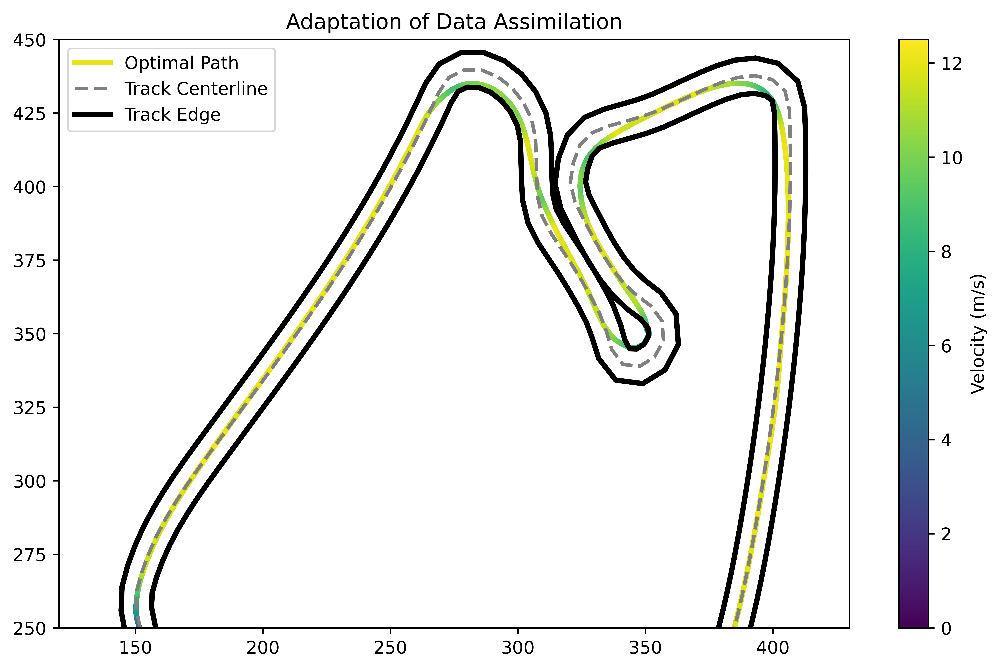

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from scipy.integrate import solve_ivp

# Define track (x_smooth, y_smooth)
x_total = np.array([])
y_total = np.array([])
v_total = np.array([])
plt.figure(figsize=(10, 6))

def compute_perpendiculars(x, y):
    dx = np.gradient(x)
    dy = np.gradient(y)
    lengths = np.sqrt(dx**2 + dy**2)
    dx /= lengths
    dy /= lengths
    px = -dy
    py = dx
    return px, py


for i in range(2):
    start_x, end_x = 100 * i, min(i*100 + 100, len(x_smooth))
    
    print(start_x, end_x)
    t = np.linspace(0, 1, len(x_smooth[start_x:end_x]))
    x_interp = interp1d(t, x_smooth[start_x:end_x], kind='cubic')
    y_interp = interp1d(t, y_smooth[start_x:end_x], kind='cubic')


    # Car parameters
    L = 3  # Wheelbase
    max_accel = 50 # Max acceleration
    max_steer = np.radians(30)  # Max steering angle

    def speed_control(x, y, v, base_accel=3.0):
        """
        Adjusts acceleration based on track curvature.

        Parameters:
            x, y: Current vehicle position.
            v: Current velocity.
            base_accel: Desired acceleration level.

        Returns:
            Adjusted acceleration.
        """
        t_vals = np.linspace(0, 1, 100)
        track_points = np.array([x_interp(t_vals), y_interp(t_vals)]).T
        distances = np.linalg.norm(track_points - np.array([x, y]), axis=1)
        closest_idx = np.argmin(distances)

        # Compute curvature (approximate)
        if closest_idx < len(t_vals) - 2:
            p1 = track_points[closest_idx]
            p2 = track_points[closest_idx + 1]
            p3 = track_points[closest_idx + 2]

            # Curvature formula: k = (dx * ddy - dy * ddx) / ((dx^2 + dy^2)^(3/2))
            dx = p2[0] - p1[0]
            dy = p2[1] - p1[1]
            ddx = p3[0] - 2 * p2[0] + p1[0]
            ddy = p3[1] - 2 * p2[1] + p1[1]

            curvature = abs(dx * ddy - dy * ddx) / (dx**2 + dy**2 + 1e-3)**(1.5)
        else:
            curvature = 0.0  # Straight line

        # Reduce acceleration when approaching high curvature
        max_speed = max(5.0, 12.0 - 50 * curvature)  # Slower in sharp turns

        if v > max_speed:
            return -2.0  # Brake if too fast
        else:
            return base_accel  # Accelerate normally

    def stanley_controller(x, y, theta, v, lookahead=2, k=1.5, damping=0.1):
        """
        Stanley Controller for steering correction.
        
        Parameters:
            x, y: Current vehicle position.
            theta: Current vehicle heading angle.
            v: Current velocity.
            lookahead: Look-ahead distance for reference point.
            k: Gain factor for cross-track error correction.
        
        Returns:
            Steering angle delta
        """
        # Find the closest point on the track
        t_vals = np.linspace(0, 1, 100)
        track_points = np.array([x_interp(t_vals), y_interp(t_vals)]).T
        distances = np.linalg.norm(track_points - np.array([x, y]), axis=1, ord=2)
        closest_idx = np.argmin(distances)

        # Lookahead point
        lookahead_idx = min(closest_idx + lookahead, len(t_vals) - 1)
        target_x, target_y = track_points[lookahead_idx]

        # Compute cross-track error
        cross_track_error = (np.linalg.norm([target_x - x, target_y - y]) / 50) ** 2

        # Compute heading error
        
        track_heading = np.arctan2(target_y - y, target_x - x)
        heading_error = track_heading - theta

        # Stanley steering law
        delta = heading_error + np.arctan(k * cross_track_error / (v + 1e-3))
        delta = delta * (1 - damping * abs(delta))

        return np.clip(delta, -max_steer, max_steer)

    # Define racecar dynamics
    def racecar_dynamics(t, state, control_func, lookahead=2):
        x, y, v, theta = state
        a, delta = control_func(t, state, lookahead)  # Get control inputs

        dxdt = v * np.cos(theta)
        dydt = v * np.sin(theta)
        dvdt = np.clip(a, -max_accel, max_accel)  # Limit acceleration
        dthetadt = (v / L) * np.tan(np.clip(delta, -max_steer, max_steer))  # Steering dynamics
        
        return [dxdt, dydt, dvdt, dthetadt]


    def hamiltonian(state, costate, control):
        """
        Compute the Hamiltonian for the system.

        Parameters:
            state: [x, y, v, theta]
            costate: [λ_x, λ_y, λ_v, λ_theta]
            control: [a, delta] (acceleration, steering angle)

        Returns:
            Hamiltonian value
        """
        x, y, v, theta = state
        λ_x, λ_y, λ_v, λ_theta = costate
        a, delta = control

        # Compute derivatives
        dxdt = v * np.cos(theta)
        dydt = v * np.sin(theta)
        dvdt = np.clip(a, -max_accel, max_accel)
        dthetadt = (v / L) * np.tan(np.clip(delta, -max_steer, max_steer))

        # Define Hamiltonian
        H = λ_x * dxdt + λ_y * dydt + λ_v * dvdt + λ_theta * dthetadt + 1  # "+1" to minimize time

        return H

    # Control strategy with penalty for deviation
    def control_func(t, state, lookahead=2):
        x, y, v, theta = state

        # Get smooth steering using damped Stanley Controller
        delta = stanley_controller(x, y, theta, v, lookahead=lookahead, k=1.2, damping=0.3)

        # Get acceleration based on curvature-aware speed control
        a = speed_control(x, y, v)
        # Compute costate variables (λ_x, λ_y, λ_v, λ_theta)
        λ_x = -2 * (x - x_interp(0.5))  # Example penalty for deviation from center
        λ_y = -2 * (y - y_interp(0.5))  # Example penalty for deviation from center
        λ_v = 0  # No penalty for velocity in this example
        λ_theta = 0  # No penalty for heading angle in this example

        # Compute Hamiltonian
        H = hamiltonian(state, [λ_x, λ_y, λ_v, λ_theta], [a, delta])
        # Penalize acceleration and steering angle in the Hamiltonian
        penalty_a = 0.1 * a**2  # Quadratic penalty for acceleration
        penalty_delta = 0.1 * delta**2  # Quadratic penalty for steering angle
        H += penalty_a + penalty_delta
        return a, delta


    # Solve the system
    len_of_systems = 6
    t_span = [0, len_of_systems]
    if i == 0 or i == 3:
        y0 = [x_smooth[start_x], y_smooth[start_x], 2.0, 2 * np.pi/3]  # Initial state (start at first track point)
    else: 
        y0 = [sol.y[0][-1], sol.y[1][-1], sol.y[2][-1], sol.y[3][-1]]  # Initial state (start at first track point)
    sol = solve_ivp(racecar_dynamics, t_span, y0, args=(control_func, 2), t_eval=np.linspace(0, t_span[1], 500), method="RK45")
    x_total = np.concatenate((x_total, sol.y[0]))
    y_total = np.concatenate((y_total, sol.y[1]))
    v_total = np.concatenate((v_total, sol.y[2]))
    # Create a colormap and normalization for the colorbar
    norm = plt.Normalize(vmin=0, vmax=12.5)  # Adjust vmax based on the maximum velocity
    cmap = plt.cm.viridis
    
    for j in range(len(sol.t) - 1):
        if j == 0 and i == 1:
            plt.plot(
                sol.y[0][j:j+2], sol.y[1][j:j+2],
                color=cmap(norm(sol.y[2][j])),  # Normalize velocity for color mapping
                linewidth=linewidth, label="Optimal Path")
        else:
            plt.plot(
                sol.y[0][j:j+2], sol.y[1][j:j+2],
                color=cmap(norm(sol.y[2][j])),  # Normalize velocity for color mapping
                linewidth=linewidth)

    for i in range(8):
        t_span = [0, len_of_systems]
        y0 = [sol.y[0][-1], sol.y[1][-1], sol.y[2][-1], sol.y[3][-1]]  # Initial state (start at last point of previous segment)
        sol = solve_ivp(racecar_dynamics, t_span, y0, args=(control_func, 3), t_eval=np.linspace(0, t_span[1], 500), method="RK45")
        x_total = np.concatenate((x_total, sol.y[0]))
        y_total = np.concatenate((y_total, sol.y[1]))
        v_total = np.concatenate((v_total, sol.y[2]))
        for j in range(len(sol.t) - 1):
            plt.plot(
                sol.y[0][j:j+2], sol.y[1][j:j+2],
                color=plt.cm.viridis(sol.y[2][j] / 12.5),  # Normalize velocity for color mapping
                linewidth=linewidth)
        
# plt.plot(x_total, y_total, label="Optimal Path", color="blue")
px, py = compute_perpendiculars(x_smooth[start_x:end_x], y_smooth[start_x:end_x])
track_width = 12  # Adjust as needed
linewidth = 3
x_outer = x_smooth[start_x:end_x] + (track_width / 2) * px
y_outer =  y_smooth[start_x:end_x] + (track_width / 2) * py
x_inner = x_smooth[start_x:end_x] - (track_width / 2) * px
y_inner =  y_smooth[start_x:end_x] - (track_width / 2) * py
px, py = compute_perpendiculars(x_smooth[0:end_x], y_smooth[0:end_x])
x_outer = x_smooth[0:end_x] + (track_width / 2) * px
y_outer =  y_smooth[0:end_x] + (track_width / 2) * py
x_inner = x_smooth[0:end_x] - (track_width / 2) * px
y_inner =  y_smooth[0:end_x] - (track_width / 2) * py
plt.plot(x_smooth, y_smooth, '--', color="gray", label="Track Centerline", linewidth=2)
# Add a colorbar using the ScalarMappable
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # Set an empty array to avoid warnings
plt.colorbar(sm, label='Velocity (m/s)')
plt.plot(x_inner, y_inner, color='black', linewidth=3, label='Track Edge')
plt.plot(x_outer, y_outer, color='black', linewidth=3)
plt.title("Adaptation of Data Assimilation")
plt.xlim(120, 430)
plt.ylim(250, 450)
plt.legend()
plt.show()


# Animation Code

23560 23560
151.81682032988758 249.79940270680814


/var/folders/nm/jgfv46_n3kg1pc1ltp9d95vm0000gn/T/ipykernel_81392/3531499642.py:55: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "-" (-> linestyle='-'). The keyword argument will take precedence.
  ax.plot(x_smooth, y_smooth, '-', label='Track', linewidth=2, color='k', linestyle='--')


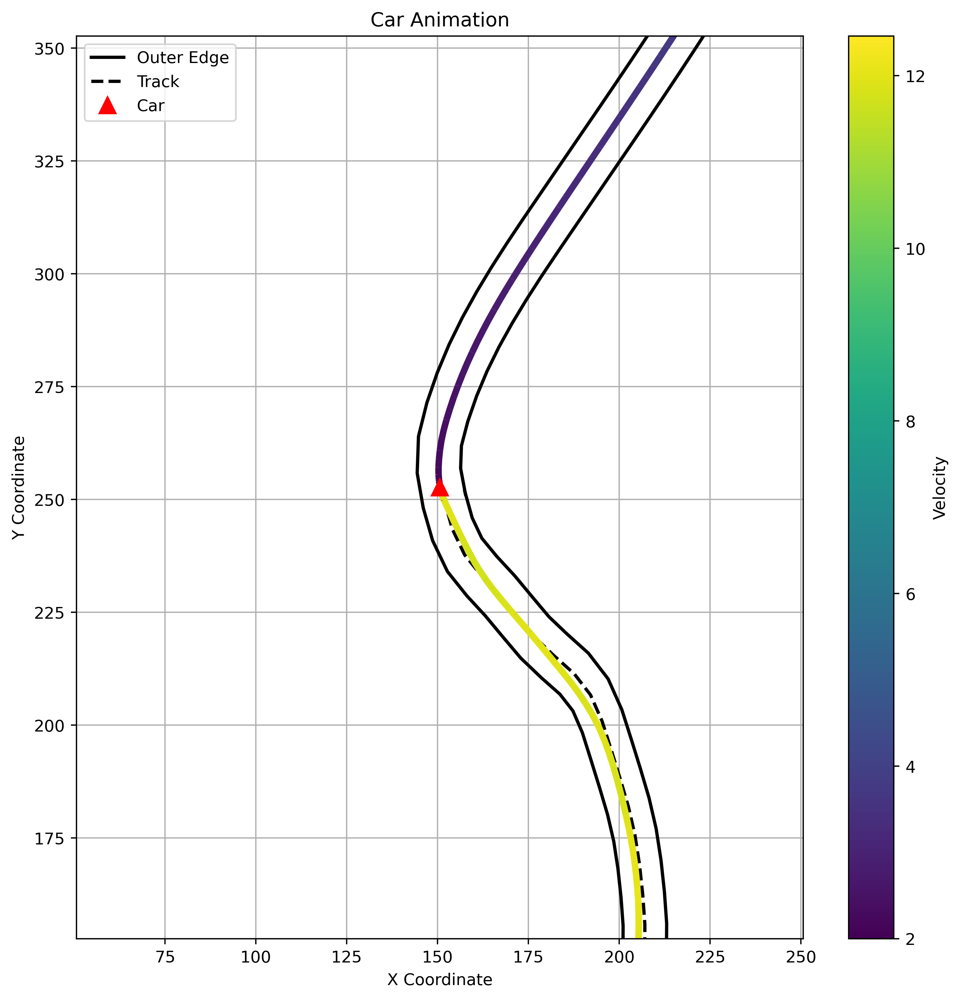

In [194]:
from matplotlib.animation import FuncAnimation, PillowWriter
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation
from matplotlib.collections import LineCollection
from matplotlib.colors import Normalize
import matplotlib.cm as cm

# Ensure total_x, total_y exist
total_x = x_total_final
total_y = y_total_final
total_v = v_total_final
print(len(total_x), len(total_y))
print(total_x[0], total_y[0])

new_x = np.array(total_x)
new_y = np.array(total_y)
# Shorten total_x to just 400 points throughout
total_x = total_x[::20]
total_y = total_y[::20]
total_v = total_v[::20]

fig, ax = plt.subplots(figsize=(10, 10))
ax.set_xlim(total_x[0] - 100, total_x[0] + 100)
ax.set_ylim(total_y[0] - 100, total_y[0] + 100)
ax.set_title("Car Animation")
ax.set_xlabel("X Coordinate")
ax.set_ylabel("Y Coordinate")

# Track and car parameters (make sure the following variables are defined)
def compute_perpendiculars(x, y):
    dx = np.gradient(x)
    dy = np.gradient(y)
    lengths = np.sqrt(dx**2 + dy**2)
    dx /= lengths
    dy /= lengths
    px = -dy
    py = dx
    return px, py

px, py = compute_perpendiculars(x_smooth, y_smooth)
track_width = 12  # Adjust as needed
linewidth = 4
x_outer = x_smooth + (track_width / 2) * px
y_outer = y_smooth + (track_width / 2) * py
x_inner = x_smooth - (track_width / 2) * px
y_inner = y_smooth - (track_width / 2) * py

# Plot the track and edges
ax.plot(x_outer, y_outer, color='black', linewidth=2, label='Outer Edge')
ax.plot(x_inner, y_inner, color='black', linewidth=2)
ax.plot(x_smooth, y_smooth, '-', label='Track', linewidth=2, color='k', linestyle='--')

# Initialize the car marker as a triangle and car path line
norm = Normalize(vmin=np.min(v_total), vmax=np.max(v_total))
cmap = cm.viridis

# Initialize empty LineCollection
segments = []
colors = []
car_path = LineCollection(segments, linewidth=4, cmap=cmap, norm=norm)
ax.add_collection(car_path)

# Triangle marker for the car
car_marker, = ax.plot([], [], '^', markersize=10, color='red', label='Car')

def update(frame):
    # Update car marker
    car_marker.set_data(total_x[frame], total_y[frame])
    ax.set_xlim(total_x[frame] - 100, total_x[frame] + 100)
    ax.set_ylim(total_y[frame] - 100, total_y[frame] + 100)

    # Build segments up to current frame
    if frame > 0:
        x = total_x[:frame+1]
        y = total_y[:frame+1]
        points = np.array([x, y]).T.reshape(-1, 1, 2)
        segs = np.concatenate([points[:-1], points[1:]], axis=1)
        vel = v_total[:frame]  # velocity per segment
        car_path.set_segments(segs)
        car_path.set_array(vel)  # this assigns the color per segment

    return car_marker, car_path

# Optional: Add a colorbar
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # only needed for colorbar
cbar = plt.colorbar(sm, ax=ax, label='Velocity')

# Animate
ani = FuncAnimation(fig, update, frames=len(total_x), blit=True, interval=50)
ani.save("colored_velocity_path2.mp4", writer=animation.FFMpegWriter(fps=20))

# Display the plot
plt.legend()
plt.grid(True)
plt.show()